In [3]:
import tensorflow as tf

from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import numpy as np

import seaborn as sns

import os    
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

In [4]:
ds_train = tf.keras.preprocessing.image_dataset_from_directory(
    'E:\\diplom\\datasets\\malevis\\300x300\\train — копия (2)',
    labels='inferred',
    label_mode='categorical',
    color_mode='rgb',
    batch_size=32,
    image_size=(300, 300),
    shuffle = True
)

ds_val = tf.keras.preprocessing.image_dataset_from_directory(
    'E:\\diplom\\datasets\\malevis\\300x300\\val — копия (2)',
    labels='inferred',
    label_mode='categorical',
    color_mode='rgb',
    batch_size=32,
    image_size=(300, 300),
    shuffle = True,
)

val_batches = tf.data.experimental.cardinality(ds_val)
ds_test = ds_val.take(val_batches // 5)
ds_val = ds_val.skip(val_batches // 5)

print('Number of validation batches: %d' % tf.data.experimental.cardinality(ds_val))
print('Number of test batches: %d' % tf.data.experimental.cardinality(ds_test))

Found 9100 files belonging to 26 classes.
Found 5126 files belonging to 26 classes.
Number of validation batches: 129
Number of test batches: 32


In [5]:
AUTOTUNE = tf.data.AUTOTUNE

ds_train = ds_train.prefetch(buffer_size=AUTOTUNE)
ds_val = ds_val.prefetch(buffer_size=AUTOTUNE)
ds_test = ds_test.prefetch(buffer_size=AUTOTUNE)

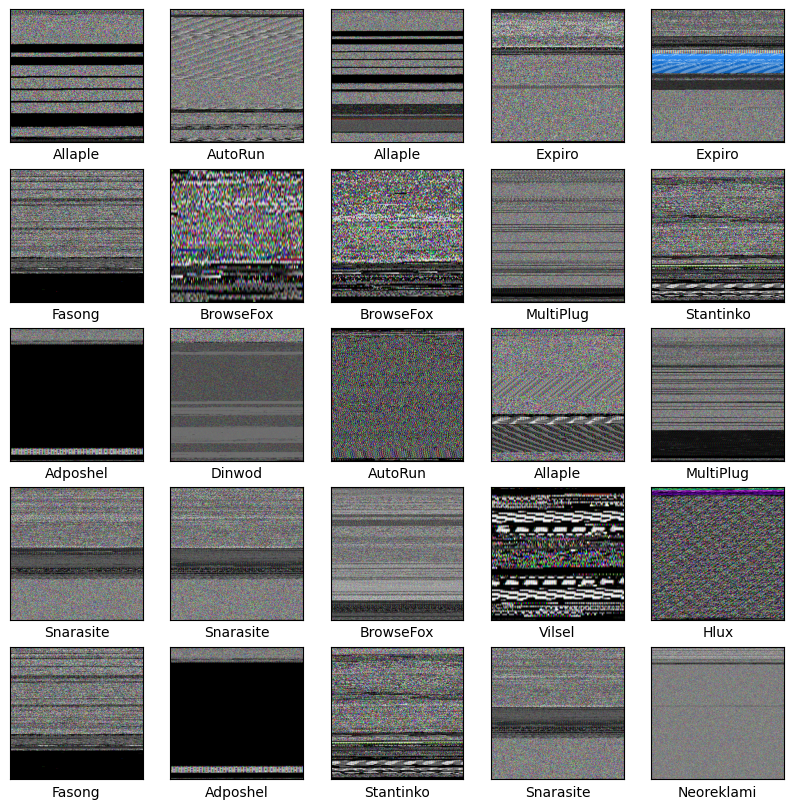

In [6]:
class_names = ["Adposhel", "Agent", "Allaple", "Amonetize", "Androm", "AutoRun", "BrowseFox", "Dinwod",
               "Elex", "Expiro", "Fasong", "HackKMS", "Hlux", "Injector", "InstallCore", "MultiPlug",
               "Neoreklami", "Neshta", "Other", "Regrun", "Sality", "Snarasite", "Stantinko", "Hilium", "VBKrypt", "Vilsel"]

for images, labels in ds_train.take(1):
    images = np.array(images.numpy(), np.uint8)
    plt.figure(figsize=(10,10))
    for i in range(25):
        c = np.argmax(labels[i])
        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i])
        plt.xlabel(class_names[c])
    plt.show()
    break

In [5]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [6]:
base_model = tf.keras.applications.MobileNetV2(input_shape=(300, 300, 3),
                                               include_top=False,
                                               weights='imagenet')

In [7]:
image_batch, label_batch = next(iter(ds_train))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 10, 10, 1280)


In [8]:
base_model.trainable = False

In [1]:
base_model.summary()

NameError: name 'base_model' is not defined

In [10]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


In [11]:
prediction_layer = tf.keras.layers.Dense(26)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 26)


In [12]:
inputs = tf.keras.Input(shape=(300, 300, 3))
x = preprocess_input(inputs)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [13]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [14]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 300, 300, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 300, 300, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 300, 300, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 10, 10, 1280)     2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [15]:
len(model.trainable_variables)

2

In [16]:
# Number of epochs for model training (increase for the better accuracy)
initial_epochs = 20

loss0, accuracy0 = model.evaluate(ds_val)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

129/129 [==============================] - 172s 1s/step - loss: 3.5424 - accuracy: 0.0154
initial loss: 3.54
initial accuracy: 0.02


In [17]:
history = model.fit(ds_train,
                    epochs=initial_epochs,
                    validation_data=ds_val)

Epoch 1/20
285/285 [==============================] - 472s 2s/step - loss: 2.5935 - accuracy: 0.3236 - val_loss: 2.0562 - val_accuracy: 0.5073
Epoch 2/20
285/285 [==============================] - 456s 2s/step - loss: 1.5744 - accuracy: 0.6479 - val_loss: 1.6513 - val_accuracy: 0.6007
Epoch 3/20
285/285 [==============================] - 456s 2s/step - loss: 1.2084 - accuracy: 0.7226 - val_loss: 1.4428 - val_accuracy: 0.6529
Epoch 4/20
285/285 [==============================] - 455s 2s/step - loss: 1.0052 - accuracy: 0.7632 - val_loss: 1.3395 - val_accuracy: 0.6836
Epoch 5/20
285/285 [==============================] - 496s 2s/step - loss: 0.8762 - accuracy: 0.7905 - val_loss: 1.2406 - val_accuracy: 0.7128
Epoch 6/20
285/285 [==============================] - 500s 2s/step - loss: 0.7857 - accuracy: 0.8114 - val_loss: 1.1931 - val_accuracy: 0.7214
Epoch 7/20
285/285 [==============================] - 517s 2s/step - loss: 0.7162 - accuracy: 0.8262 - val_loss: 1.1369 - val_accuracy: 0.7360

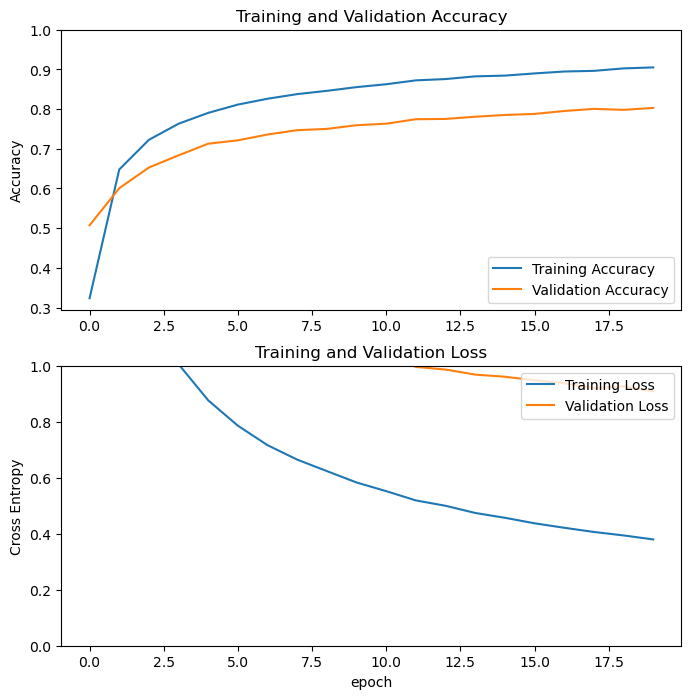

In [18]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [19]:
#model.save("saloviho_DP_detetion")

INFO:tensorflow:Assets written to: saloviho_DP_detetion\assets


INFO:tensorflow:Assets written to: saloviho_DP_detetion\assets


In [20]:
base_model.trainable = True

In [21]:
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  154


In [22]:
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
              metrics=['accuracy'])

In [23]:
# Number of epochs for fine-tuning (increase for better accuracy)
fine_tune_epochs = 10
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(ds_train,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=ds_val)

Epoch 20/30
285/285 [==============================] - 670s 2s/step - loss: 0.3166 - accuracy: 0.9079 - val_loss: 0.8925 - val_accuracy: 0.8218
Epoch 21/30
285/285 [==============================] - 672s 2s/step - loss: 0.2404 - accuracy: 0.9304 - val_loss: 0.7976 - val_accuracy: 0.8450
Epoch 22/30
285/285 [==============================] - 670s 2s/step - loss: 0.1991 - accuracy: 0.9464 - val_loss: 0.8909 - val_accuracy: 0.8294
Epoch 23/30
285/285 [==============================] - 669s 2s/step - loss: 0.1666 - accuracy: 0.9525 - val_loss: 0.7864 - val_accuracy: 0.8450
Epoch 24/30
285/285 [==============================] - 671s 2s/step - loss: 0.1428 - accuracy: 0.9609 - val_loss: 0.9555 - val_accuracy: 0.8267
Epoch 25/30
285/285 [==============================] - 675s 2s/step - loss: 0.1239 - accuracy: 0.9680 - val_loss: 0.7540 - val_accuracy: 0.8540
Epoch 26/30
285/285 [==============================] - 688s 2s/step - loss: 0.1035 - accuracy: 0.9729 - val_loss: 0.7794 - val_accuracy:

In [24]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

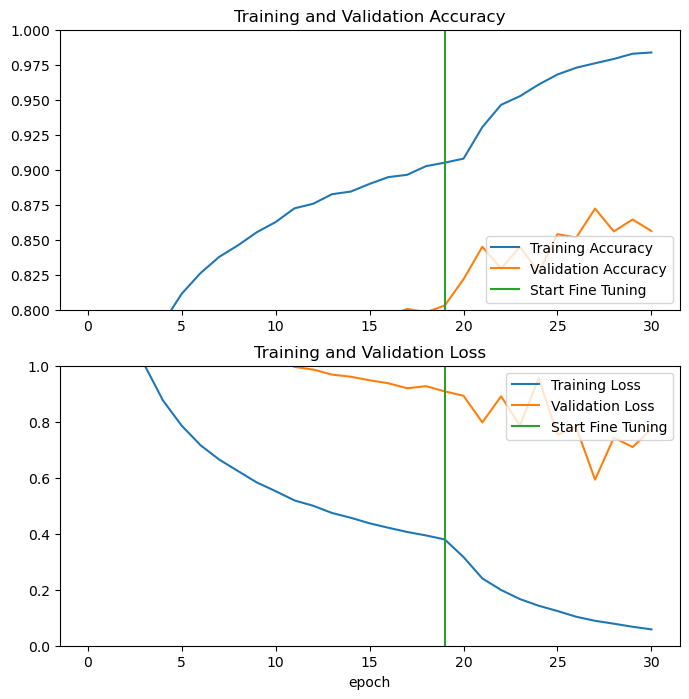

In [25]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [7]:
model = tf.keras.models.load_model('saloviho_DP_detetion')

In [8]:
loss, accuracy = model.evaluate(ds_val)
print('Validation accuracy :', accuracy)

129/129 [==============================] - 396s 3s/step - loss: 0.8971 - accuracy: 0.8057
Validation accuracy : 0.8057045340538025


Predictions:
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 

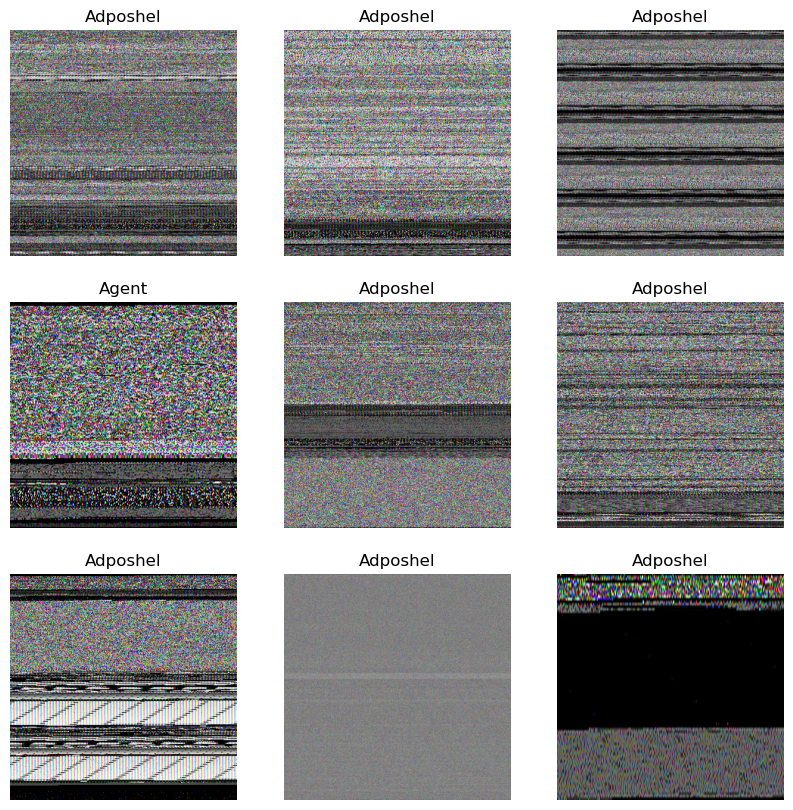

In [27]:
image_batch, label_batch = ds_test.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch).flatten()

# Apply a sigmoid since our model returns logits
predictions = tf.nn.sigmoid(predictions)
predictions = tf.where(predictions < 0.5, 0, 1)

print('Predictions:\n', predictions.numpy())
print('Labels:\n', label_batch)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(class_names[predictions[i]])
  plt.axis("off")

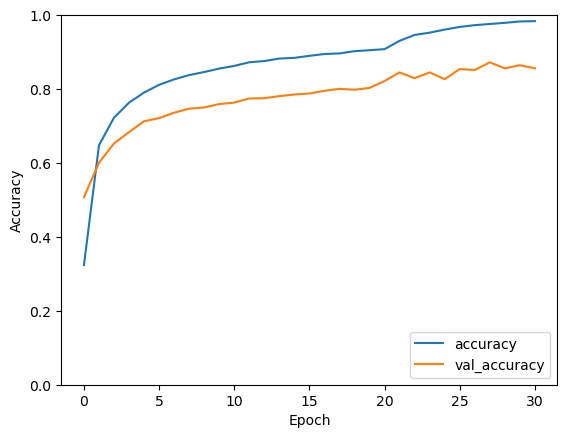

In [28]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')

In [36]:
train_loss, train_acc = model.evaluate(ds_train)
print(train_acc)

285/285 [==============================] - 348s 1s/step - loss: 0.3386 - accuracy: 0.9195
0.9194505214691162


In [38]:
val_loss, val_acc = model.evaluate(ds_val)
print(val_acc)

129/129 [==============================] - 179s 1s/step - loss: 0.9004 - accuracy: 0.8040
0.8039980530738831


In [29]:
test_loss, test_acc = model.evaluate(ds_test)
print(test_acc)

32/32 [==============================] - 40s 1s/step - loss: 0.7959 - accuracy: 0.8486
0.8486328125


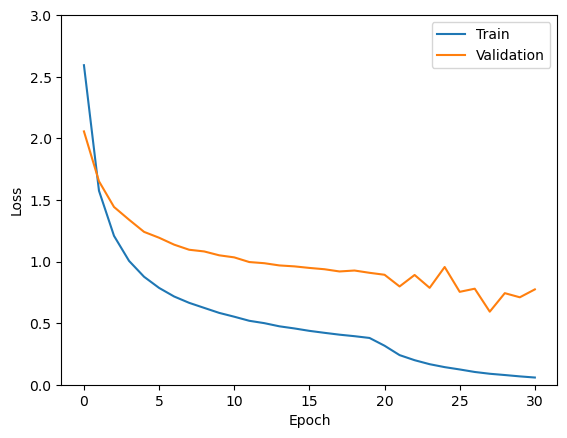

In [30]:
plt.plot(history.history['loss'], label = 'train')
plt.plot(history.history['val_loss'], label = 'test')
plt.ylabel('Loss')

max_loss = max(history.history['loss'] + history.history['val_loss'])

plt.ylim([0, np.ceil(max_loss)])
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation']) 

In [31]:
#import keras
#model = keras.models.load_model("saloviho_DP")

In [17]:
def get_actual_predicted_labels(dataset):
    actual = None
    predicted = None
    for batch in dataset.as_numpy_iterator():
        image_batch, label_batch = batch
        predictions = model.predict_on_batch(image_batch)
        if predicted is None:
            predicted = np.argmax(predictions, axis=1)
            actual = np.argmax(label_batch, axis=1)
        else:
            predicted = np.concatenate((predicted, np.argmax(predictions, axis=1)))
            actual = np.concatenate((actual, np.argmax(label_batch, axis=1)))
    return actual, predicted

In [18]:
def plot_confusion_matrix(actual, predicted, labels, ds_type):
  cm = tf.math.confusion_matrix(actual, predicted)
  ax = sns.heatmap(cm, annot=True)
  sns.set(rc={'figure.figsize':(26, 26)})
  sns.set(font_scale=1.4)
  ax.set_title('Confusion matrix of action recognition for ' + ds_type)
  ax.set_xlabel('Predicted Action')
  ax.set_ylabel('Actual Action')
  plt.xticks(rotation=90)
  plt.yticks(rotation=0)
  ax.xaxis.set_ticklabels(labels)
  ax.yaxis.set_ticklabels(labels)

In [31]:
def calculate_classification_metrics(y_actual, y_pred, labels):
  """
    Calculate the precision and recall of a classification model using the ground truth and
    predicted values. 

    Args:
      y_actual: Ground truth labels.
      y_pred: Predicted labels.
      labels: List of classification labels.

    Return:
      Precision and recall measures.
  """
  cm = tf.math.confusion_matrix(y_actual, y_pred)
  tp = np.diag(cm) # Diagonal represents true positives
  precision = dict()
  recall = dict()
  for i in range(len(labels)):
    col = cm[:, i]
    fp = np.sum(col) - tp[i] # Sum of column minus true positive is false negative

    row = cm[i, :]
    fn = np.sum(row) - tp[i] # Sum of row minus true positive, is false negative
    precision[labels[i]] = tp[i] / (tp[i] + fp) # Precision 

    recall[labels[i]] = tp[i] / (tp[i] + fn) # Recall

  return precision, recall

In [26]:
actual, predicted = get_actual_predicted_labels(ds_train)

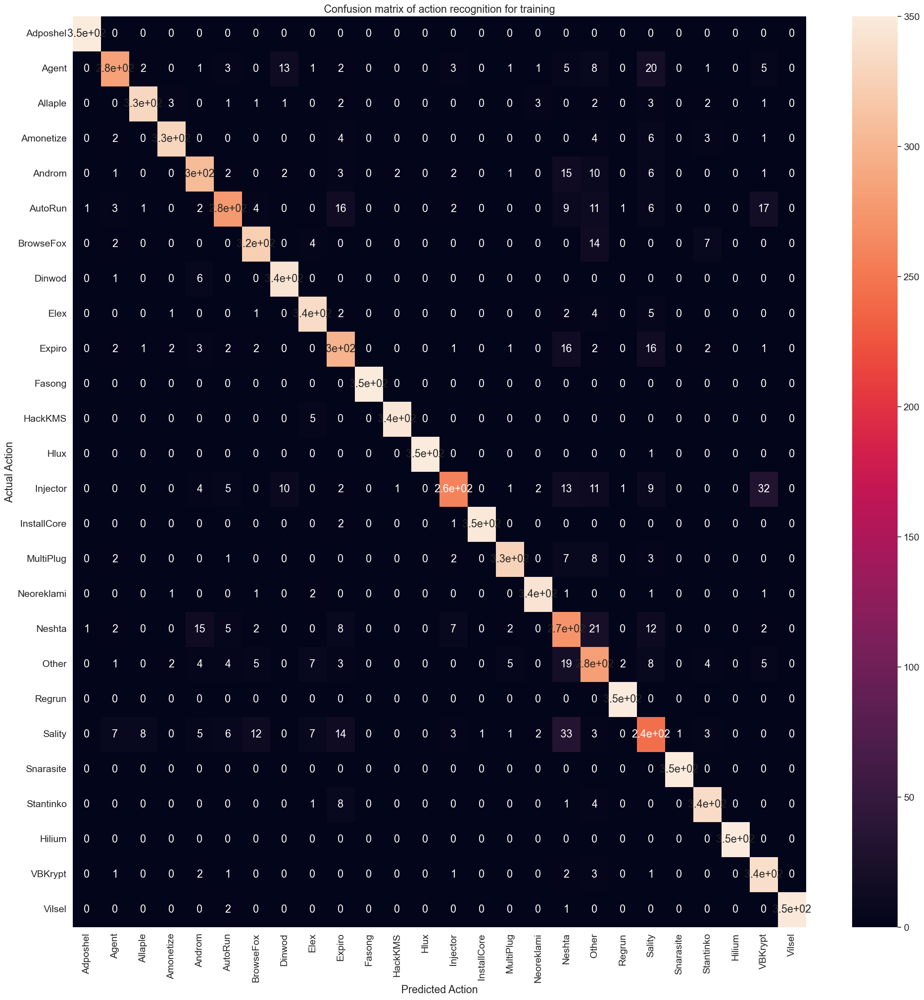

In [28]:
plot_confusion_matrix(actual, predicted, class_names, 'training')

In [29]:
print(len(actual))

9100


In [32]:
precision, recall = calculate_classification_metrics(actual, predicted, class_names)

In [33]:
f1_scores = {}
for key in precision:
    p = precision[key]
    r = recall[key]
    if p + r == 0:
        f1 = 0
    else:
        f1 = 2 * (p * r) / (p + r)
    f1_scores[key] = f1

f1_scores

{'Adposhel': 0.9971509971509972,
 'Agent': 0.8632218844984801,
 'Allaple': 0.9552669552669553,
 'Amonetize': 0.957910014513788,
 'Androm': 0.8751793400286944,
 'AutoRun': 0.8406676783004553,
 'BrowseFox': 0.9215406562054208,
 'Dinwod': 0.9541029207232267,
 'Elex': 0.9410112359550563,
 'Expiro': 0.8363636363636364,
 'Fasong': 1.0,
 'HackKMS': 0.9885386819484241,
 'Hlux': 0.9985693848354792,
 'Injector': 0.820919175911252,
 'InstallCore': 0.994269340974212,
 'MultiPlug': 0.9492017416545718,
 'Neoreklami': 0.9786019971469331,
 'Neshta': 0.7309236947791165,
 'Other': 0.7635869565217391,
 'Regrun': 0.9943181818181819,
 'Sality': 0.7062228654124457,
 'Snarasite': 0.9985734664764622,
 'Stantinko': 0.9491525423728814,
 'Hilium': 1.0,
 'VBKrypt': 0.8980132450331125,
 'Vilsel': 0.9956958393113342}

In [35]:
average_precision = sum(precision.values()) / len(precision)
average_recall = sum(recall.values()) / len(recall)
average_f1 = 2*average_precision*average_recall/(average_precision + average_recall)

print(average_precision)
print(average_recall)
print(average_f1)


0.9218947433978563
0.9194505494505495
0.9206710242178532


In [39]:
actual, predicted = get_actual_predicted_labels(ds_val)

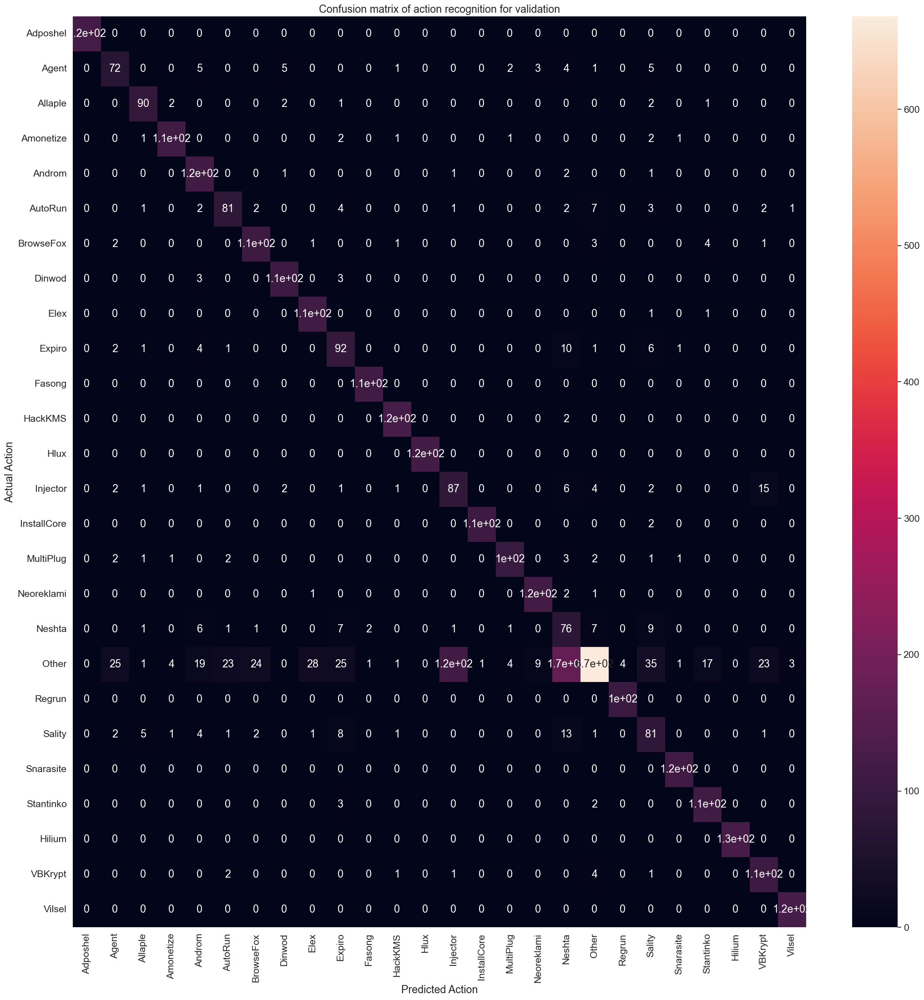

In [40]:
plot_confusion_matrix(actual, predicted, class_names, 'validation')

In [41]:
print(len(actual))

4102


In [21]:
actual, predicted = get_actual_predicted_labels(ds_test)

In [42]:
precision, recall = calculate_classification_metrics(actual, predicted, class_names)

In [43]:
f1_scores = {}
for key in precision:
    p = precision[key]
    r = recall[key]
    if p + r == 0:
        f1 = 0
    else:
        f1 = 2 * (p * r) / (p + r)
    f1_scores[key] = f1

f1_scores

{'Adposhel': 1.0,
 'Agent': 0.7024390243902439,
 'Allaple': 0.9,
 'Amonetize': 0.9338842975206612,
 'Androm': 0.8268551236749117,
 'AutoRun': 0.7465437788018433,
 'BrowseFox': 0.8392156862745098,
 'Dinwod': 0.9316239316239316,
 'Elex': 0.8725868725868725,
 'Expiro': 0.6969696969696969,
 'Fasong': 0.9870129870129869,
 'HackKMS': 0.9647058823529412,
 'Hlux': 1.0,
 'Injector': 0.5272727272727273,
 'InstallCore': 0.9861751152073732,
 'MultiPlug': 0.9049773755656108,
 'Neoreklami': 0.9374999999999999,
 'Neshta': 0.37623762376237624,
 'Other': 0.7009443861490031,
 'Regrun': 0.9807692307692307,
 'Sality': 0.5955882352941176,
 'Snarasite': 0.9831932773109243,
 'Stantinko': 0.890625,
 'Hilium': 1.0,
 'VBKrypt': 0.8075471698113207,
 'Vilsel': 0.9842519685039369}

In [44]:
average_precision = sum(precision.values()) / len(precision)
average_recall = sum(recall.values()) / len(recall)
average_f1 = 2*average_precision*average_recall/(average_precision + average_recall)

print(average_precision)
print(average_recall)
print(average_f1)


0.8240677121563281
0.8935991880477936
0.8574261265578187


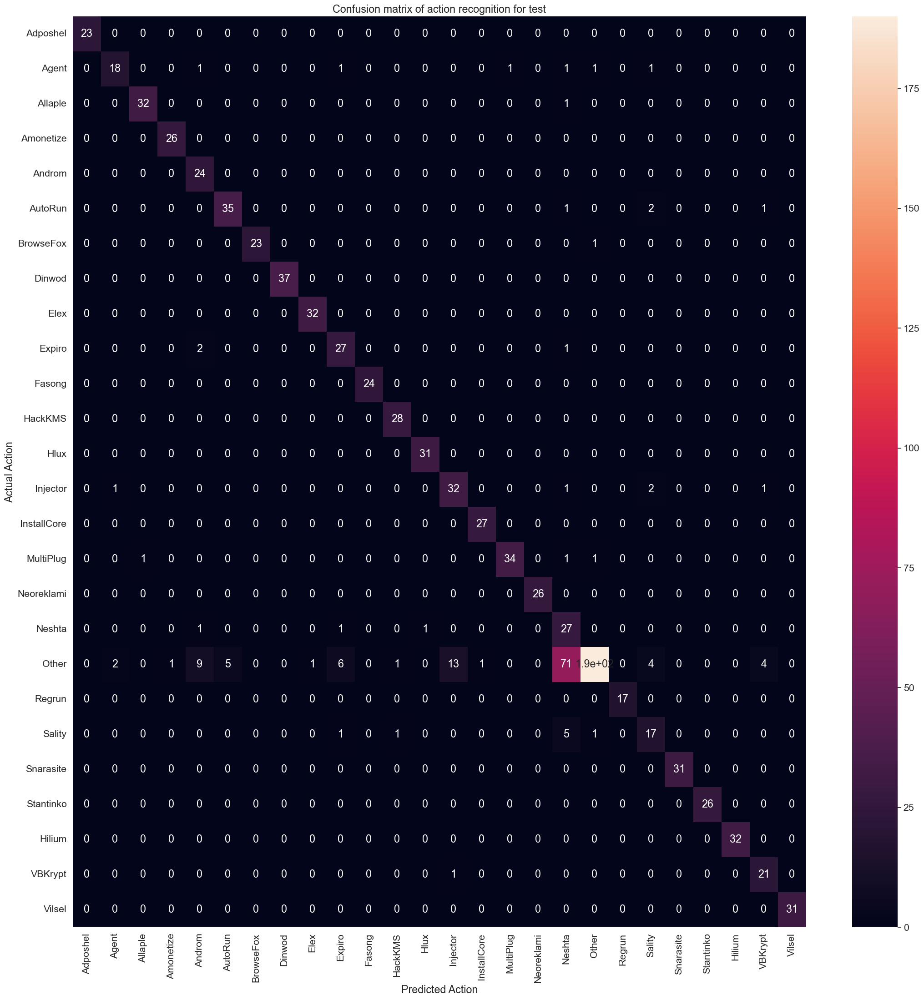

In [49]:
plot_confusion_matrix(actual, predicted, class_names, 'test')

In [23]:
print(len(actual))

1024


Predictions:
 [18  7 15 18  4 18 18  6 17 20 13 17 18 18  8 14 10  9 20 12 11  4 10 14
 16 18 18  5 18  7 15 23]
Labels:
 [18  7 15 18  4 18 18  6 13 20 18 18 18 18  8 14 10  9 18 12 11  4 10 14
 16 18 18  5 15  7 15 23]


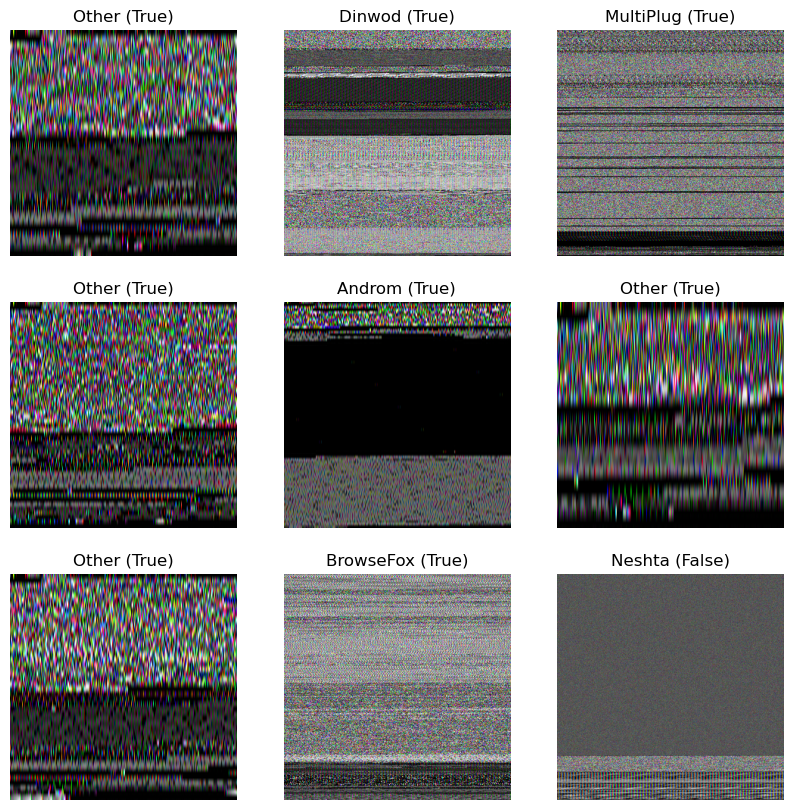

In [12]:
image_batch, label_batch = ds_test.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch)
predictions = np.argmax(predictions, axis=1)
label_batch = np.argmax(label_batch, axis=1)

print('Predictions:\n', predictions)
print('Labels:\n', label_batch)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(f"{class_names[predictions[i]]} ({predictions[i] == label_batch[i]})")
  plt.axis("off")

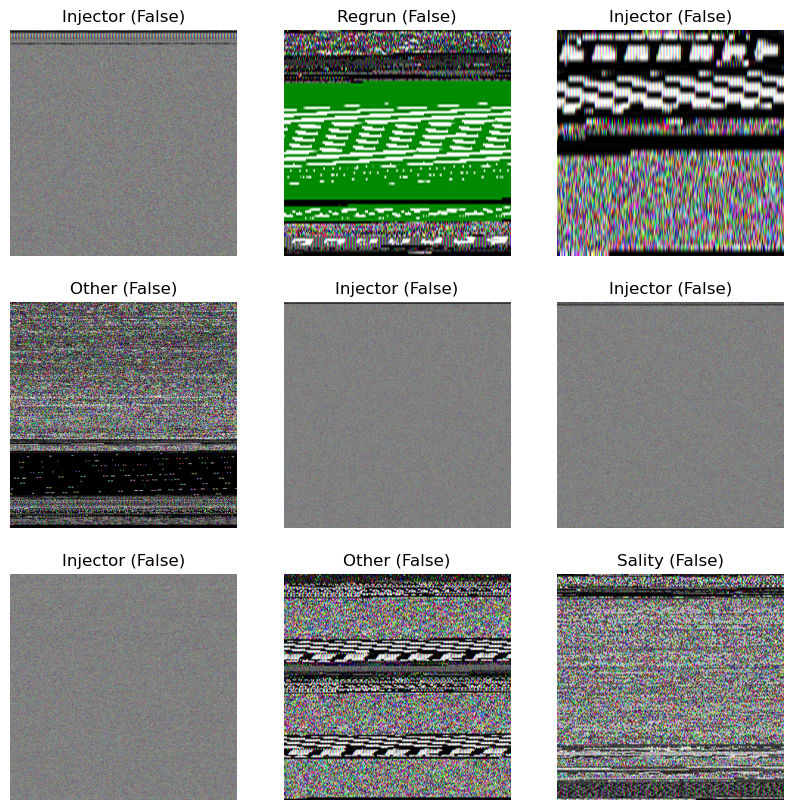

In [11]:
index = 1

plt.figure(figsize=(10, 10))
for image_batch, label_batch in ds_test.as_numpy_iterator():
    predictions = model.predict_on_batch(image_batch)
    predictions = np.argmax(predictions, axis=1)
    label_batch = np.argmax(label_batch, axis=1)

    #print('Predictions:\n', predictions)
    #print('Labels:\n', label_batch)
    for i in range(9):
      if index > 9:
          break
      if predictions[i] == label_batch[i]:
          i = i - 1
          continue
      ax = plt.subplot(3, 3, index)
      plt.imshow(image_batch[i].astype("uint8"))
      plt.title(f"{class_names[predictions[i]]} ({predictions[i] == label_batch[i]})")
      plt.axis("off")
      index += 1
    if index > 9:
        break

In [53]:
precision, recall = calculate_classification_metrics(actual, predicted, class_names)

In [54]:
precision

{'Adposhel': 1.0,
 'Agent': 0.8571428571428571,
 'Allaple': 0.9696969696969697,
 'Amonetize': 0.9629629629629629,
 'Androm': 0.6486486486486487,
 'AutoRun': 0.875,
 'BrowseFox': 1.0,
 'Dinwod': 1.0,
 'Elex': 0.9696969696969697,
 'Expiro': 0.75,
 'Fasong': 1.0,
 'HackKMS': 0.9333333333333333,
 'Hlux': 0.96875,
 'Injector': 0.6956521739130435,
 'InstallCore': 0.9642857142857143,
 'MultiPlug': 0.9714285714285714,
 'Neoreklami': 1.0,
 'Neshta': 0.24770642201834864,
 'Other': 0.979381443298969,
 'Regrun': 1.0,
 'Sality': 0.6538461538461539,
 'Snarasite': 1.0,
 'Stantinko': 1.0,
 'Hilium': 1.0,
 'VBKrypt': 0.7777777777777778,
 'Vilsel': 1.0}

In [55]:
recall

{'Adposhel': 1.0,
 'Agent': 0.75,
 'Allaple': 0.9696969696969697,
 'Amonetize': 1.0,
 'Androm': 1.0,
 'AutoRun': 0.8974358974358975,
 'BrowseFox': 0.9583333333333334,
 'Dinwod': 1.0,
 'Elex': 1.0,
 'Expiro': 0.9,
 'Fasong': 1.0,
 'HackKMS': 1.0,
 'Hlux': 1.0,
 'Injector': 0.8648648648648649,
 'InstallCore': 1.0,
 'MultiPlug': 0.918918918918919,
 'Neoreklami': 1.0,
 'Neshta': 0.9,
 'Other': 0.6168831168831169,
 'Regrun': 1.0,
 'Sality': 0.68,
 'Snarasite': 1.0,
 'Stantinko': 1.0,
 'Hilium': 1.0,
 'VBKrypt': 0.9545454545454546,
 'Vilsel': 1.0}

In [58]:
f1_scores = {}
for key in precision:
    p = precision[key]
    r = recall[key]
    if p + r == 0:
        f1 = 0
    else:
        f1 = 2 * (p * r) / (p + r)
    f1_scores[key] = f1

f1_scores

{'Adposhel': 1.0,
 'Agent': 0.7999999999999999,
 'Allaple': 0.9696969696969697,
 'Amonetize': 0.9811320754716981,
 'Androm': 0.7868852459016393,
 'AutoRun': 0.8860759493670887,
 'BrowseFox': 0.9787234042553191,
 'Dinwod': 1.0,
 'Elex': 0.9846153846153847,
 'Expiro': 0.8181818181818182,
 'Fasong': 1.0,
 'HackKMS': 0.9655172413793104,
 'Hlux': 0.9841269841269841,
 'Injector': 0.7710843373493975,
 'InstallCore': 0.9818181818181818,
 'MultiPlug': 0.9444444444444445,
 'Neoreklami': 1.0,
 'Neshta': 0.38848920863309355,
 'Other': 0.7569721115537849,
 'Regrun': 1.0,
 'Sality': 0.6666666666666666,
 'Snarasite': 1.0,
 'Stantinko': 1.0,
 'Hilium': 1.0,
 'VBKrypt': 0.8571428571428572,
 'Vilsel': 1.0}

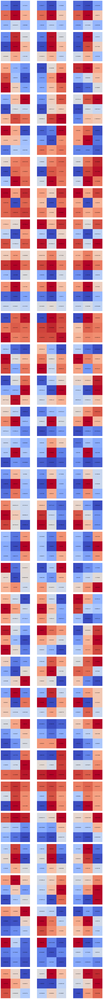

In [248]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'model' is your pre-defined model
layer = model.layers[3].layers[1]  # Adjust this as per your model's architecture
filters = layer.get_weights()[0]  # Extract filters
n_filters = filters.shape[3]  # Number of filters
n_channels = filters.shape[2]  # Number of channels per filter

# Total number of images to plot
n_images = n_filters * n_channels

# Determine the size of the grid
n_cols = 3
n_rows = n_images // n_cols + (n_images % n_cols != 0)  # Compute rows needed

# Create a figure with subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))

# Normalize filter values to [0, 1] range for better visualization
#filters_min, filters_max = filters.min(), filters.max()
#filters = (filters - filters_min) / (filters_max - filters_min)

# Plot each filter's channels
image_index = 0
for i in range(n_filters):
    for k in range(n_channels):
        ax = axs[image_index // n_cols, image_index % n_cols]
        f = filters[:, :, k, i]
        
        for x in range(f.shape[0]):
            for y in range(f.shape[1]):
                ax.text(y, x, f[x, y], fontsize=8, ha='center', va='center', color='black')
        
        ax.imshow(f, cmap='coolwarm')#,  vmin=0, vmax=1)
        ax.axis('off')
        image_index += 1

# Hide any remaining empty subplots
for idx in range(image_index, n_rows * n_cols):
    axs[idx // n_cols, idx % n_cols].axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.tight_layout()
# Display the plot
plt.show()


-9.66904e-20
1/1 [==============================] - 0s 305ms/step
(1, 150, 150, 32)


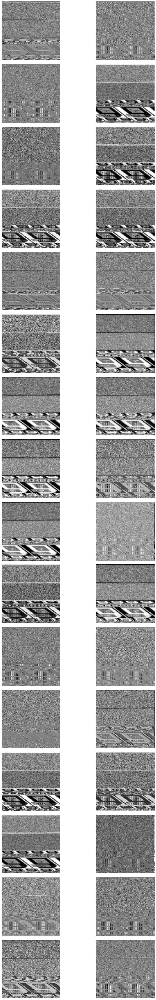

In [251]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model

# Load your image
img_path = 'ransomware.png'
img = image.load_img(img_path, target_size=(300, 300))  # Adjust target_size as per your model's input shape
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array = img_array / 255.0  # Normalize if required by your model

# Assuming 'model' is your pre-defined model
intermediate_layer_model = Model(inputs=model.layers[3].input,
                                 outputs=model.layers[3].layers[1].output)

# Get the feature maps

filters = intermediate_layer_model.layers[-1].get_weights()[0]
print(np.sum(filters[:, :, :, 3]))


feature_maps = intermediate_layer_model.predict(img_array)
print(feature_maps.shape)  # This will give you the shape of the feature maps

# Determine the number of feature maps
n_features = feature_maps.shape[-1]

# Determine the grid size for plotting
n_cols = 2  # Number of columns in the grid
n_rows = n_features // n_cols  # Number of rows in the grid

# Plot the feature maps
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 64))

for i in range(n_rows):
    for j in range(n_cols):
        ax = axs[i, j]
        feature_map_index = i * n_cols + j
        if feature_map_index < n_features:
            ax.imshow(feature_maps[0, :, :, feature_map_index], cmap='gray')
            ax.axis('off')
        else:
            ax.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.tight_layout()
plt.show()

#### 